# Exploratory Data Analysis on Crimes in Boston Dataset

![Boston_Image](https://www.history.com/.image/ar_16:9%2Cc_fill%2Ccs_srgb%2Cfl_progressive%2Cq_auto:good%2Cw_1200/MTYyNDgzMzUzNjQ2Mjc3Nzgw/topic-boston-gettyimages-564358796-promo.jpg)

**by : Delabrilliano Ismail**

## Background

Boston, officially the City of Boston, is the capital and most populous city of the Commonwealth of Massachusetts in the United States and 24th-most populous city in the country. The city proper covers about 48.4 sq mi with a population of 675,647 in 2020, also making it the most populous city in New England. ```Source: https://en.wikipedia.org/wiki/Boston```

By being one of the populous city in the US and having a good database of crime that is accessible to public, We will try to analyze and gain insights from the database to be able to understand more about the crime, specifically in the city of Boston itself.

## Data Understanding

We use the data that we get from Boston Police Department website and use the database from 2015-2021. All of the data contains 17 columns that are described below:

1. **INCIDENT_NUMBER**: Unique number of each case (One case can contain multiple offences)
2. **OFFENSE_CODE**: Code of Crime's Offense.
3. **OFFENSE_CODE_GROUP**: Name of the offense.
4. **OFFENSE_DESCRIPTION**: Description of the offense.
5. **DISTRICT**: Boston Disctrict Code
6. **REPORTING_AREA**: Area number where crimes occurred.
7. **SHOOTING**: Indicate if there are a shooting involves.
8. **OCCURRED_ON_DATE**: Time of incidents/crime.
9. **YEAR**: Year of the occurred crimes.
10. **MONTH**: Month of the occurred crimes.
11. **DAY OF WEEK**: Day of the occurred crimes.
12. **HOUR**: Hour of the occurred crimes.
13. **UCR_PART**: Uniform Crime Reporting Offence types.
14. **STREET**: Street name where crime occurred.
15. **LAT**: The latitude where the crime happened.
16. **LONG**: The longitude where the crime happened.
17. **LOCATION**: Combination of Lat and Long (Lat, Long).


**Project Limitation**

1. This project will use the database that is provided by Boston Police Departement (BPD) from 2015-2021. But, the data from 2015 started only from June. So later we will drop all of the 2015 data.

2. The UCR PART columns data is only available until 2018. So later when we analyze the column, we will only analyzing the crime that occurs 2016-2018.

3. There are several Offense Code meaning that are not available on the BPS website. So later we will use the Offense Description column value for the Offense Code Group missing value.

Database Source: 
- https://www.kaggle.com/datasets/AnalyzeBoston/crimes-in-boston
- https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system

## Problem

__Problem Statement__

1. Using the data from Federal Bureau of Investigation (FBI) and the Bureau of Justice Statistics (BJS), Pew Research Center have found that Americans tend to believe crime is up, even when the data shows it is down. In 20 of 24 Gallup surveys conducted since 1993, at least 60% of U.S. adults have said there is more crime nationally than there was the year before, despite the generally downward trend in national violent and property crime rates during most of that period. ```Source: https://www.pewresearch.org/fact-tank/2020/11/20/facts-about-crime-in-the-u-s/```

2. The crime rate in Boston is considerably higher than the national average across all communities in America from the largest to the smallest, although at 26 crimes per one thousand residents, it is not among the communities with the very highest crime rate. The chance of becoming a victim of either violent or property crime in Boston is 1 in 38. Based on FBI crime data, Boston is not one of the safest communities in America. Relative to Massachusetts, Boston has a crime rate that is higher than 98% of the state's cities and towns of all sizes. ```Source: https://www.neighborhoodscout.com/ma/boston/crime#description```

To summarize, the problems that we will try to answer are:

1. Is it true that the numbers of crimes is up each year?

2. What can the government (Including the Police) do to reduce the crime numbers in Boston and make it safer for the citizen?

3. What can the citizen of Boston do to keep themselves safe?

## Goals

1. Finding the trends of crime number in general year over year.

2. Recommend an action to be taken by the government to make Boston a lot safer.

3. Giving recommendation for citizen of Boston to avoid crime in their city.

In [2]:
## Import Package

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as plx
import folium
from folium.plugins import HeatMap

In [3]:
df2015 = pd.read_csv('crime-incident-reports-2015.csv', dtype={'INCIDENT_NUMBER' : object})
df2016 = pd.read_csv('crime-incident-reports-2016.csv', dtype={'INCIDENT_NUMBER' : object})
df2017 = pd.read_csv('crime-incident-reports-2017.csv', dtype={'INCIDENT_NUMBER' : object})
df2018 = pd.read_csv('crime-incident-reports-2018.csv', dtype={'INCIDENT_NUMBER' : object})
df2019 = pd.read_csv('crime-incident-reports-2019.csv', dtype={'INCIDENT_NUMBER' : object})
df2020 = pd.read_csv('crime-incident-reports-2020.csv', dtype={'INCIDENT_NUMBER' : object})
df2021 = pd.read_csv('crime-incident-reports-2021.csv', dtype={'INCIDENT_NUMBER' : object})

In [4]:
## Ensure all columns name are the same

In [5]:
dflist = [df2015, df2016, df2017, df2018, df2019, df2020, df2021]

if all([set(dflist[0].columns) == set(df.columns) for df in dflist]):
    print('All Columns Names are the same')
else:
    print('Different Columns Name')

All Columns Names are the same


In [6]:
### Combining all Dataframe into one Dataframe
df = pd.concat(dflist, ignore_index=True)

In [7]:
display(df.head(),df.tail())

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I192068249,2647,Other,THREATS TO DO BODILY HARM,B2,280,NaN,2015-08-28 10:20:00,2015,8,Friday,10,Part Two,WASHINGTON ST,42.330119,-71.084251,"(42.33011862, -71.08425106)"
1,I192061894,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,356,NaN,2015-08-20 00:00:00,2015,8,Thursday,0,Part Two,CHARLES ST,42.300605,-71.061268,"(42.30060543, -71.06126785)"
2,I192038828,1107,Fraud,FRAUD - IMPERSONATION,A1,172,NaN,2015-11-02 12:24:00,2015,11,Monday,12,Part Two,ALBANY ST,42.334288,-71.072395,"(42.33428841, -71.07239518)"
3,I192008877,1107,Fraud,FRAUD - IMPERSONATION,E18,525,NaN,2015-07-31 10:00:00,2015,7,Friday,10,Part Two,WINGATE RD,42.237009,-71.129566,"(42.23700950, -71.12956606)"
4,I182090828,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D4,159,NaN,2015-12-01 12:00:00,2015,12,Tuesday,12,Part Two,UPTON ST,42.342432,-71.072258,"(42.34243222, -71.07225766)"


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
583047,121005808,1102,NaN,FRAUD - FALSE PRETENSE / SCHEME,B3,289,0,2021-01-19 12:00:00,2021,1,Tuesday,12,NaN,CLARKWOOD ST,42.333679,-71.091878,"(42.33367921810846, -71.09187754618458)"
583048,121000816,3304,NaN,NOISY PARTY/RADIO-NO ARREST,E5,675,0,2021-01-04 00:00:00,2021,1,Monday,0,NaN,BRADFIELD AVENUE,0.000000,0.000000,"(0, 0)"
583049,120221042,3006,NaN,SICK/INJURED/MEDICAL - PERSON,E5,680,0,2021-04-02 10:45:00,2021,4,Friday,10,NaN,WASHINGTON ST,42.283902,-71.130863,"(42.283902436483125, -71.13086262643496)"
583050,10637224,3125,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,D4,270,0,2021-01-26 18:54:00,2021,1,Tuesday,18,NaN,NORTHAMPTON ST,42.333951,-71.075389,"(42.333951248393774, -71.07538938822692)"
583051,023844463,3115,NaN,INVESTIGATE PERSON,C6,,0,2021-10-16 01:16:00,2021,10,Saturday,1,NaN,G ST & E 8TH ST\nBOSTON MA 02127\nUNITED STATES,42.331320,-71.044080,"(42.33132003900925, -71.04407996166562)"


### Data Wrangling

Before we clean the data, we need to gain an insight and understanding about the data itself. In order to do that, we will do a descriptive statistics to gain a bigger picture of the dataframe itself.

In [8]:
## Describe and Check Datatypes

In [9]:
df.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,583052.000000,583052.000000,583052.000000,583052.00000,560522.000000,5.605220e+05
mean,2333.679723,2017.971093,6.815948,13.01574,36.907757,-6.199312e+01
std,1196.744885,1.850788,3.349042,6.33983,14.138758,2.373645e+01
min,100.000000,2015.000000,1.000000,0.00000,-1.000000,-7.117867e+01
25%,1102.000000,2016.000000,4.000000,9.00000,42.284826,-7.109317e+01
50%,3005.000000,2018.000000,7.000000,14.00000,42.317304,-7.107284e+01
75%,3201.000000,2019.000000,10.000000,18.00000,42.344896,-7.105643e+01
max,99999.000000,2021.000000,12.000000,23.00000,42.395042,5.249691e-08


In [10]:
df.describe(include='O')

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,UCR_PART,STREET,Location
count,583052,353253,583052,578913,583052,231254,583052,583052,353156,571165,583052
unique,540979,67,304,13,881,3,443710,7,4,14301,44523
top,I152071596,Motor Vehicle Accident Response,INVESTIGATE PERSON,B2,,0,2016-08-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0, 0)"
freq,20,41064,38121,89604,55657,226958,33,88797,176042,28564,70849


The `.describe` function cannot give us a full descriptive statistics that we want. And because of that, we will make the descriptive statistic function manually that can facilitate the datasets that contains all categorical data with different datatypes.

In [11]:
Describe = []

for i in df.columns:
    Describe.append([
        i,
        df[i].dtypes,
        df[i].mode()[0],
        df[i].notnull().sum(),
        df[i].isna().sum(),
        round((df[i].isna().sum() / len(df)) * 100, 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(data = Describe,
columns = [
    'Columns',
    'DataType',
    'Mode',
    'Non-Null',
    'Null',
    'NullPercentage',
    'Unique',
    'Unique Sample'
])

,Columns,DataType,Mode,Non-Null,Null,NullPercentage,Unique,Unique Sample
0,INCIDENT_NUMBER,object,I152071596,583052,0,0.00,540979,"[I172010935, I152095034]"
1,OFFENSE_CODE,int64,3115,583052,0,0.00,254,"[3102, 727]"
2,OFFENSE_CODE_GROUP,object,Motor Vehicle Accident Response,353253,229799,39.41,67,"[Vandalism, Fraud]"
3,OFFENSE_DESCRIPTION,object,INVESTIGATE PERSON,583052,0,0.00,304,"[DRUGS - POSSESSION/ SALE/ MANUFACTURING/ USE,..."
4,DISTRICT,object,B2,578913,4139,0.71,13,"[A15, E13]"
5,REPORTING_AREA,object,,583052,0,0.00,881,"[214, 666]"
6,SHOOTING,object,0,231254,351798,60.34,3,"[Y, 0]"
7,OCCURRED_ON_DATE,object,2016-08-01 00:00:00,583052,0,0.00,443710,"[2019-02-27 20:27:00, 2018-10-27 09:59:00]"
8,YEAR,int64,2017,583052,0,0.00,7,"[2018, 2020]"
9,MONTH,int64,8,583052,0,0.00,12,"[11, 5]"


From the data descriptive statistics above, we can notice there are several anomalies in the dataframe.

Let's try to fix the anomalies of:

#### 1. Wrong datatypes for "OCCURED_ON_DATE" Columns:

In [12]:
df['OCCURRED_ON_DATE'] = df['OCCURRED_ON_DATE'].astype('datetime64')

In [13]:
df['OCCURRED_ON_DATE'].head()

0   2015-08-28 10:20:00
1   2015-08-20 00:00:00
2   2015-11-02 12:24:00
3   2015-07-31 10:00:00
4   2015-12-01 12:00:00
Name: OCCURRED_ON_DATE, dtype: datetime64[ns]

#### 2. Mode of "REPORTING_AREA" Column is " " but no missing value.

In [14]:
df[df['REPORTING_AREA'] == ' '].head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
9,I182061268,3201,Property Lost,PROPERTY - LOST,NaN,,NaN,2015-06-15 00:00:00,2015,6,Monday,0,Part Three,BERNARD,-1.0,-1.0,"(-1.00000000, -1.00000000)"
23,I182008210,1107,Fraud,FRAUD - IMPERSONATION,NaN,,NaN,2015-07-01 00:00:00,2015,7,Wednesday,0,Part Two,COBDEN,-1.0,-1.0,"(-1.00000000, -1.00000000)"
83,I162101249,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,E18,,NaN,2015-12-24 20:00:00,2015,12,Thursday,20,Part Two,CUMMINS HWY,NaN,NaN,"(0.00000000, 0.00000000)"
112,I162083921,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D4,,NaN,2015-09-20 12:00:00,2015,9,Sunday,12,Part Two,CLARENDON ST,NaN,NaN,"(0.00000000, 0.00000000)"
166,I162041845,3201,Property Lost,PROPERTY - LOST,D4,,NaN,2015-09-01 12:00:00,2015,9,Tuesday,12,Part Three,NaN,NaN,NaN,"(0.00000000, 0.00000000)"


In [15]:
df['REPORTING_AREA'].replace(' ', np.nan, inplace=True)

In [16]:
df[df['REPORTING_AREA'] == ' '].head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


Now, there are no ' ' value anymore in the "REPORTING_AREA" column.

#### 3. Mode of "Lat", "Long", and "Location" Columns is "0" but no missing value.

In [17]:
df['Lat'].replace(0, np.nan, inplace=True)
df['Long'].replace(0, np.nan, inplace=True)
df['Location'].replace('(0, 0)', np.nan, inplace=True)

In [18]:
print(f'''Lat = {df['Lat'].mode()[0]}
Long = {df['Long'].mode()[0]}
Location = {df['Location'].mode()[0]}''')

Lat = 42.29755532959655
Long = -71.05970910242573
Location = (0.00000000, 0.00000000)


The mode on 'Location' column is still '0, 0' So we need to run another `.replace` for the value.

In [19]:
df['Location'].replace('(0.00000000, 0.00000000)', np.nan, inplace=True)
print(f'''
Location = {df['Location'].mode()[0]}''')


Location = (42.29755532959655, -71.05970910242573)


Let's run a crosstab to make sure there are no more wrong Lat, Long, and Location input

In [20]:
pd.crosstab(index=[df['Lat'], df['Long'], df['Location']], columns='Total Crime')

col_0                                                                       Total Crime
Lat           Long          Location                                                   
-1.000000e+00 -1.000000e+00 (-1.00000000, -1.00000000)                              839
 1.327276e-07  5.249691e-08 (1.32727612912185e-07, 5.24969124614893e-08)              1
                            (1.327276129121855e-07, 5.249691246148932e-08)            2
 4.220776e+01 -7.110130e+01 (42.20775997895064, -71.10130004652127)                   1
 4.223241e+01 -7.112972e+01 (42.23241330, -71.12971531)                              10
...                                                                                 ...
 4.239425e+01 -7.106740e+01 (42.3942509682607, -71.0673969508073)                     1
 4.239448e+01 -7.106716e+01 (42.3944844647032, -71.0671596742613)                     4
 4.239504e+01 -7.101018e+01 (42.39504158, -71.01017732)                              30
                            (42.3950415802391, -71.0101773168781)                     6
                            (42.39504158023912, -71.01017731687807)                  10

[44521 rows x 1 columns]

We can see that there are another anomalies on Lat, Long, and Location input which is '-1.00000000'

Now we will need to replace the value with null value.

In [21]:
df['Location'].replace('(-1.00000000, -1.00000000)', np.nan, inplace=True)
df['Lat'].replace(-1.00000000, np.nan, inplace=True)
df['Long'].replace(-1.00000000, np.nan, inplace=True)

pd.crosstab(index=[df['Lat'], df['Long'], df['Location']], columns='Total Crime')

col_0                                                                      Total Crime
Lat          Long          Location                                                   
1.327276e-07  5.249691e-08 (1.32727612912185e-07, 5.24969124614893e-08)              1
                           (1.327276129121855e-07, 5.249691246148932e-08)            2
4.220776e+01 -7.110130e+01 (42.20775997895064, -71.10130004652127)                   1
4.223241e+01 -7.112972e+01 (42.23241330, -71.12971531)                              10
                           (42.23241330329528, -71.12971530731747)                   1
...                                                                                ...
4.239425e+01 -7.106740e+01 (42.3942509682607, -71.0673969508073)                     1
4.239448e+01 -7.106716e+01 (42.3944844647032, -71.0671596742613)                     4
4.239504e+01 -7.101018e+01 (42.39504158, -71.01017732)                              30
                           (42.3950415802391, -71.0101773168781)                     6
                           (42.39504158023912, -71.01017731687807)                  10

[44520 rows x 1 columns]

Now we can see that the value of '-1.00000000' is removed. Thus we can continue to fix another anomalies.

Let's check the descriptive statistics again for the dataframe

In [22]:
Describe = []

for i in df.columns:
    Describe.append([
        i,
        df[i].dtypes,
        df[i].mode()[0],
        df[i].notnull().sum(),
        df[i].isna().sum(),
        round((df[i].isna().sum() / len(df)) * 100, 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(data = Describe,
columns = [
    'Columns',
    'DataType',
    'Mode',
    'Non-Null',
    'Null',
    'NullPercentage',
    'Unique',
    'Unique Sample'
])

,Columns,DataType,Mode,Non-Null,Null,NullPercentage,Unique,Unique Sample
0,INCIDENT_NUMBER,object,I152071596,583052,0,0.00,540979,"[192027655, 192034523]"
1,OFFENSE_CODE,int64,3115,583052,0,0.00,254,"[2664, 801]"
2,OFFENSE_CODE_GROUP,object,Motor Vehicle Accident Response,353253,229799,39.41,67,"[nan, Towed]"
3,OFFENSE_DESCRIPTION,object,INVESTIGATE PERSON,583052,0,0.00,304,"[B&E NON-RESIDENCE DAY - NO PROP TAKEN, ASSAUL..."
4,DISTRICT,object,B2,578913,4139,0.71,13,"[C6, nan]"
5,REPORTING_AREA,object,355,527395,55657,9.55,880,"[462, 597]"
6,SHOOTING,object,0,231254,351798,60.34,3,"[0, Y]"
7,OCCURRED_ON_DATE,datetime64[ns],2016-08-01 00:00:00,583052,0,0.00,443710,"[2018-03-11T03:44:00.000000000, 2017-02-03T11:..."
8,YEAR,int64,2017,583052,0,0.00,7,"[2021, 2020]"
9,MONTH,int64,8,583052,0,0.00,12,"[12, 3]"


We can see now that the "Lat" and "Long" columns mode and null row are matched with the "Location" columns as it should be.

### Handling Missing Value

#### 1. OFFENSE_CODE_GROUP

For this column, we will use the Offense Codes provided by Boston Police Department (https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system)

In [23]:
## Handling Missing Value from Offense_Code_Group:

df_off_codes = pd.read_excel('rmsoffensecodes.xlsx')
df_off_codes.head()

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


In [24]:
## Renaming the columns to match columns name on df

df_off_codes.rename(columns = {'CODE':'OFFENSE_CODE'}, inplace = True)
df_off_codes.head()

,OFFENSE_CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


In [25]:
#Creating Dictionary for the Offense Code

offense_dict = pd.Series(df_off_codes.NAME.values,index=df_off_codes.OFFENSE_CODE).to_dict()

In [26]:
## Map the dictionary to the Offense Code on df

df['OFFENSE_CODE_GROUP'] = df['OFFENSE_CODE'].map(offense_dict)
df['OFFENSE_CODE_GROUP'].isnull().sum()

11750

The missing value has been reduced to from 229.799 to 11.750.

For the remaining missing value, we will use the value from 'OFFENSE_DESCRIPTION' columns

In [27]:
df['OFFENSE_CODE_GROUP'].fillna(df['OFFENSE_DESCRIPTION'], inplace=True)
df['OFFENSE_CODE_GROUP'].isna().sum()

0

#### 2. SHOOTING

for this column, the missing value is caused by the different formatting of the columns.
The data from 2015-2018 sheets, use 'Y' to indicate if there is a shooting involve in the incident, and leave it blank if there is no shooting.
From 2019-2021 sheets, it uses '0' to indicate no shooting involved and '1' to indicate if there is a shooting

So based on that, we will change the null value to '0' and 'Y' to 1.

In [28]:
df['SHOOTING'].fillna(0, inplace=True)
df["SHOOTING"] = df["SHOOTING"].replace("Y", 1)

## Now the unique value should be 2 value (0 and 1) and no missing value.

In [29]:
print(f'''The total unique value on SHOOTING columns = {df['SHOOTING'].nunique()}
Total Missing Value on SHOOTING columns = {df['SHOOTING'].isna().sum()}''')

The total unique value on SHOOTING columns = 2
Total Missing Value on SHOOTING columns = 0


#### 3.UCR Part, District, Street, Reporting Area, Lat, Long, and Location

For the columns of UCR Part, District, Street, Reporting Area, Lat, Long, and Location we will not drop the row that contains missing value for now because we will be using it for other analysis. But we will drop the row with missing value later when we will conduct an analysis related with the columns.

In [30]:
Describe = []

for i in df.columns:
    Describe.append([
        i,
        df[i].dtypes,
        df[i].mode()[0],
        df[i].notnull().sum(),
        df[i].isna().sum(),
        round((df[i].isna().sum() / len(df)) * 100, 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(data = Describe,
columns = [
    'Columns',
    'DataType',
    'Mode',
    'Non-Null',
    'Null',
    'NullPercentage',
    'Unique',
    'Unique Sample'
])

,Columns,DataType,Mode,Non-Null,Null,NullPercentage,Unique,Unique Sample
0,INCIDENT_NUMBER,object,I152071596,583052,0,0.00,540979,"[I172054995, 192069178]"
1,OFFENSE_CODE,int64,3115,583052,0,0.00,254,"[3123, 521]"
2,OFFENSE_CODE_GROUP,object,INVESTIGATE PERSON,583052,0,0.00,253,"[A&B ON POLICE OFFICER, Migrated Report - Affr..."
3,OFFENSE_DESCRIPTION,object,INVESTIGATE PERSON,583052,0,0.00,304,"[Migrated Report - Death Investigation, FRAUD ..."
4,DISTRICT,object,B2,578913,4139,0.71,13,"[A1, E5]"
5,REPORTING_AREA,object,355,527395,55657,9.55,880,"[400, 207]"
6,SHOOTING,int64,0,583052,0,0.00,2,"[1, 0]"
7,OCCURRED_ON_DATE,datetime64[ns],2016-08-01 00:00:00,583052,0,0.00,443710,"[2020-04-03T09:00:00.000000000, 2017-11-22T15:..."
8,YEAR,int64,2017,583052,0,0.00,7,"[2020, 2016]"
9,MONTH,int64,8,583052,0,0.00,12,"[6, 1]"


In [31]:
df.drop(columns='OFFENSE_DESCRIPTION', inplace=True)

### Check and Handle Duplicates

In [32]:
df.duplicated().sum()

652

In [33]:
df[df.duplicated(keep=False)]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
1249,I152107190,413,ASSAULT D/W - OTHER,B3,427,1,2015-12-29 08:47:00,2015,12,Tuesday,8,Part One,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
1250,I152107190,413,ASSAULT D/W - OTHER,B3,427,1,2015-12-29 08:47:00,2015,12,Tuesday,8,Part One,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
1251,I152107190,111,MURDER NON-NEGLIGIENT MANSLAUGHTER,B3,427,1,2015-12-29 08:47:00,2015,12,Tuesday,8,Part One,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
1252,I152107190,111,MURDER NON-NEGLIGIENT MANSLAUGHTER,B3,427,1,2015-12-29 08:47:00,2015,12,Tuesday,8,Part One,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
1253,I152107190,3125,WARRANT ARREST,B3,427,1,2015-12-29 08:47:00,2015,12,Tuesday,8,Part Three,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353247,I070720870-00,802,ASSAULT & BATTERY,B2,318,0,2018-12-13 00:00:00,2018,12,Thursday,0,Part Two,BROOKLEDGE ST,42.309563,-71.089902,"(42.30956305, -71.08990197)"
353248,I070720870-00,802,ASSAULT & BATTERY,B2,318,0,2018-12-13 00:00:00,2018,12,Thursday,0,Part Two,BROOKLEDGE ST,42.309563,-71.089902,"(42.30956305, -71.08990197)"
353249,I070720870-00,3125,WARRANT ARREST,B2,318,0,2018-12-13 00:00:00,2018,12,Thursday,0,Part Three,BROOKLEDGE ST,42.309563,-71.089902,"(42.30956305, -71.08990197)"
353250,I060168073-00,1864,DRUGS - POSS CLASS D - INTENT MFR DIST DISP,E13,912,0,2018-01-27 14:01:00,2018,1,Saturday,14,Part Two,CENTRE ST,42.322838,-71.100967,"(42.32283759, -71.10096723)"


From the dataframe that displayed above, we can see that the detected duplicates are not really duplicate. And one incident number can contain more than one offences.

Based on this, we will drop the row that have a duplicate on Incident Number, Offense Code, and Occured_on_date.

In [34]:
df.drop_duplicates(subset=['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OCCURRED_ON_DATE'], inplace=True)

Next step, we will change the data from 'DISTRICT' column to be more informative using the description from the Boston Government website.

In [35]:
df['DISTRICT'].unique()

array(['B2', 'C11', 'A1', 'E18', 'D4', 'B3', nan, 'C6', 'D14', 'A7', 'E5',
       'E13', 'A15', 'External'], dtype=object)

In [36]:
df['DISTRICT']= df['DISTRICT'].replace({
'A1':'Downtown',
'A15':'Charlestown',
'A7':'East Boston',
'B2':'Roxbury',
'B3':'Mattapan',
'C6':'South Boston',
'C11':'Dorchester',
'D4' : 'South End',
'D14' : 'Brighton',
'E5' : 'West Roxbury',
'E13' : 'Jamaica Plain',
'E18' : 'Hyde Park'})

# Source: https://www.boston.gov/departments/police

To ensure all the anomalies are fixed, we will sort the data by dates and check the descriptive statistics one final time.

In [37]:
 df = df.sort_values('OCCURRED_ON_DATE', ascending=True).reset_index()
 df = df.drop(columns='index')
 display(df.head(), df.tail())

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I152059178,2647,THREATS TO DO BODILY HARM,Dorchester,359,0,2015-06-15,2015,6,Monday,0,Part Two,WASHINGTON ST,42.293606,-71.071887,"(42.29360585, -71.07188650)"
1,I152054279,1106,FRAUD - CREDIT CARD / ATM FRAUD,Mattapan,456,0,2015-06-15,2015,6,Monday,0,Part Two,HARLEM ST,42.300217,-71.080979,"(42.30021684, -71.08097940)"
2,I152049897,3201,PROPERTY - LOST,Roxbury,282,0,2015-06-15,2015,6,Monday,0,Part Three,WASHINGTON ST,42.328663,-71.085634,"(42.32866284, -71.08563401)"
3,I172040657,2629,HARASSMENT,Dorchester,397,0,2015-06-15,2015,6,Monday,0,Part Two,MELBOURNE ST,42.291093,-71.065945,"(42.29109287, -71.06594539)"
4,I162013546,3201,PROPERTY - LOST,Mattapan,433,0,2015-06-15,2015,6,Monday,0,Part Three,NORFOLK ST,42.283634,-71.082813,"(42.28363434, -71.08281320)"


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
582391,212095532,3005,SICK ASSIST,Downtown,117,0,2021-12-31 23:00:00,2021,12,Friday,23,NaN,STUART ST,42.351031,-71.063733,"(42.35103104592933, -71.06373331020067)"
582392,212095526,3111,LICENSE PREMISE VIOLATION,South Boston,NaN,0,2021-12-31 23:15:00,2021,12,Friday,23,NaN,SEAPORT BLVD,42.352756,-71.047481,"(42.352756167727144, -71.04748127479294)"
582393,212095530,3114,INVESTIGATE PROPERTY,Roxbury,NaN,0,2021-12-31 23:21:00,2021,12,Friday,23,NaN,HUMBOLDT AVE,42.314303,-71.088566,"(42.31430347467973, -71.08856593453203)"
582394,222000197,3202,PROPERTY - LOST THEN LOCATED,Mattapan,409,0,2021-12-31 23:30:00,2021,12,Friday,23,NaN,MENTON ST,42.272983,-71.078050,"(42.27298349626727, -71.07804969908256)"
582395,222000001,3115,INVESTIGATE PERSON,Downtown,NaN,0,2021-12-31 23:39:00,2021,12,Friday,23,NaN,TREMONT ST,42.349429,-71.065366,"(42.3494286414245, -71.06536641197421)"


We can see that the data starts from 15 June 2015, and 31 December 2021. Because of this, we will need to ensure all of the year represent the whole year (12 months) and then We will need to drop the row that does not represent 12 months.

In [38]:
months_on_2015 = df[df['YEAR'] == 2015]['MONTH'].nunique()
months_on_2016 = df[df['YEAR'] == 2016]['MONTH'].nunique()
months_on_2017 = df[df['YEAR'] == 2017]['MONTH'].nunique()
months_on_2018 = df[df['YEAR'] == 2018]['MONTH'].nunique()
months_on_2019 = df[df['YEAR'] == 2019]['MONTH'].nunique()
months_on_2020 = df[df['YEAR'] == 2020]['MONTH'].nunique()
months_on_2021 = df[df['YEAR'] == 2021]['MONTH'].nunique()

print(f'''
Total Months each year:
2015 = {months_on_2015}
2016 = {months_on_2016}
2017 = {months_on_2017}
2018 = {months_on_2018}
2019 = {months_on_2019}
2020 = {months_on_2020}
2021 = {months_on_2021}
''')


Total Months each year:
2015 = 7
2016 = 12
2017 = 12
2018 = 12
2019 = 12
2020 = 12
2021 = 12



We can see that only 2015 does not represent a whole year, so we will need to drop the row with 2015 year.

In [39]:
df.drop(df[df['YEAR'] == 2015].index, inplace = True)

In [40]:
df = df.sort_values('OCCURRED_ON_DATE', ascending=True).reset_index()
df = df.drop(columns='index')
display(df.head(), df.tail())

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I162020140,3115,INVESTIGATE PERSON,South End,619,0,2016-01-01,2016,1,Friday,0,Part Three,WESTLAND AVE,42.343765,-71.088669,"(42.34376458, -71.08866865)"
1,I172006977,1109,FRAUD - WIRE,Dorchester,451,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.294814,-71.072009,"(42.29481426, -71.07200871)"
2,I182008540,1201,EMBEZZLEMENT,Downtown,122,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.350005,-71.063591,"(42.35000492, -71.06359053)"
3,I162000796,3831,M/V - LEAVING SCENE - PROPERTY DAMAGE,Dorchester,435,0,2016-01-01,2016,1,Friday,0,Part Three,WASHINGTON ST,42.285811,-71.071155,"(42.28581121, -71.07115483)"
4,I192014489,1107,FRAUD - LARCENY BY SCHEME,Dorchester,352,0,2016-01-01,2016,1,Friday,0,Part Two,DITSON ST,42.301085,-71.063908,"(42.30108481, -71.06390782)"


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
528995,212095532,3005,SICK ASSIST,Downtown,117,0,2021-12-31 23:00:00,2021,12,Friday,23,NaN,STUART ST,42.351031,-71.063733,"(42.35103104592933, -71.06373331020067)"
528996,212095526,3111,LICENSE PREMISE VIOLATION,South Boston,NaN,0,2021-12-31 23:15:00,2021,12,Friday,23,NaN,SEAPORT BLVD,42.352756,-71.047481,"(42.352756167727144, -71.04748127479294)"
528997,212095530,3114,INVESTIGATE PROPERTY,Roxbury,NaN,0,2021-12-31 23:21:00,2021,12,Friday,23,NaN,HUMBOLDT AVE,42.314303,-71.088566,"(42.31430347467973, -71.08856593453203)"
528998,222000197,3202,PROPERTY - LOST THEN LOCATED,Mattapan,409,0,2021-12-31 23:30:00,2021,12,Friday,23,NaN,MENTON ST,42.272983,-71.078050,"(42.27298349626727, -71.07804969908256)"
528999,222000001,3115,INVESTIGATE PERSON,Downtown,NaN,0,2021-12-31 23:39:00,2021,12,Friday,23,NaN,TREMONT ST,42.349429,-71.065366,"(42.3494286414245, -71.06536641197421)"


We can see now that the data starts from 01 January 2016, and ends on 31 December 2021.

So this is what our final descriptive statistics from the dataframe look like after finished with the data wrangling process:

In [41]:
Describe = []

for i in df.columns:
    Describe.append([
        i,
        df[i].dtypes,
        df[i].mode()[0],
        df[i].notnull().sum(),
        df[i].isna().sum(),
        round((df[i].isna().sum() / len(df)) * 100, 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(data = Describe,
columns = [
    'Columns',
    'DataType',
    'Mode',
    'Non-Null',
    'Null',
    'NullPercentage',
    'Unique',
    'Unique Sample'
])

,Columns,DataType,Mode,Non-Null,Null,NullPercentage,Unique,Unique Sample
0,INCIDENT_NUMBER,object,I162030584,529000,0,0.00,494013,"[I182052276, 202009578]"
1,OFFENSE_CODE,int64,3115,529000,0,0.00,242,"[900, 2622]"
2,OFFENSE_CODE_GROUP,object,INVESTIGATE PERSON,529000,0,0.00,241,"[ASSAULT & BATTERY D/W - KNIFE, MURDER NON-NEG..."
3,DISTRICT,object,Roxbury,524990,4010,0.76,13,"[Jamaica Plain, East Boston]"
4,REPORTING_AREA,object,355,475065,53935,10.20,880,"[102, 271]"
5,SHOOTING,int64,0,529000,0,0.00,2,"[1, 0]"
6,OCCURRED_ON_DATE,datetime64[ns],2017-06-01 00:00:00,529000,0,0.00,405864,"[2020-11-07T08:20:00.000000000, 2018-04-23T18:..."
7,YEAR,int64,2017,529000,0,0.00,6,"[2021, 2019]"
8,MONTH,int64,8,529000,0,0.00,12,"[10, 3]"
9,DAY_OF_WEEK,object,Friday,529000,0,0.00,7,"[Saturday, Thursday]"


# EDA

Question 1:

At what year that Boston is having the highest crime occurred?

In [42]:
pd.crosstab(index=df['YEAR'], columns='Total Crime')

col_0,Total Crime
YEAR,
2016,99277
2017,101197
2018,98727
2019,87184
2020,70894
2021,71721


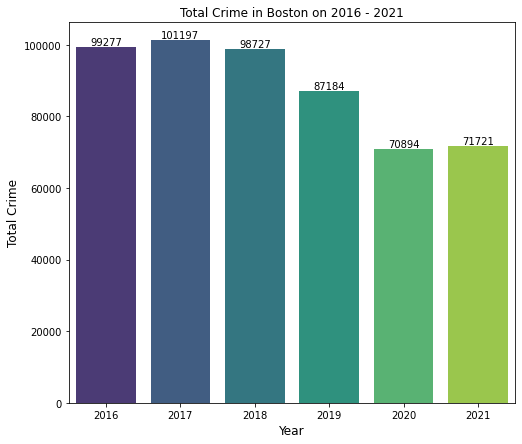

In [43]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'YEAR', data=df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston on 2016 - 2021', size=12)
plt.xlabel('Year', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insight:

From the analysis above, we can see that crime in Boston hit its peak on 2017, and have been on the downtrend afterwards, and start rising again on 2021.

Question 2:

At what month does crime in Boston oftenly occurred?

In [44]:
pd.crosstab(index=df['MONTH'], columns='Total Crime')

col_0,Total Crime
MONTH,
1,42115
2,38626
3,42663
4,41177
5,45694
6,46586
7,47201
8,48742
9,47198


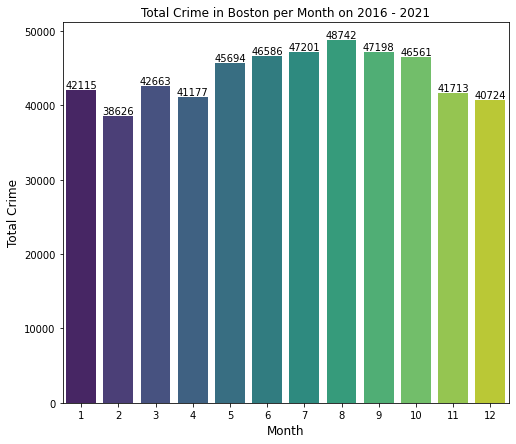

In [45]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'MONTH', data=df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston per Month on 2016 - 2021', size=12)
plt.xlabel('Month', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insights:

From the analysis above, it can be seen that the crimes peaked on August.

To analyze it further, we will categorize the months into season and see what season most crime occurred on.

In [46]:
def Seasons(mth):
    if (mth == 3 or mth == 4 or mth == 5):
       return "Spring"
    elif(mth == 6 or mth == 7 or mth == 8):
       return "Summer"
    elif(mth == 9 or mth==10 or mth == 11):
       return "Autumn"
    else:
       return "Winter"

## Source: https://www.timeanddate.com/calendar/aboutseasons.html

Then we'll insert the function into new column called 'Season' on the dataframe

In [47]:
df['Season'] = df.loc[:, 'MONTH'].apply(Seasons)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season
0,I162020140,3115,INVESTIGATE PERSON,South End,619,0,2016-01-01,2016,1,Friday,0,Part Three,WESTLAND AVE,42.343765,-71.088669,"(42.34376458, -71.08866865)",Winter
1,I172006977,1109,FRAUD - WIRE,Dorchester,451,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.294814,-71.072009,"(42.29481426, -71.07200871)",Winter
2,I182008540,1201,EMBEZZLEMENT,Downtown,122,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.350005,-71.063591,"(42.35000492, -71.06359053)",Winter
3,I162000796,3831,M/V - LEAVING SCENE - PROPERTY DAMAGE,Dorchester,435,0,2016-01-01,2016,1,Friday,0,Part Three,WASHINGTON ST,42.285811,-71.071155,"(42.28581121, -71.07115483)",Winter
4,I192014489,1107,FRAUD - LARCENY BY SCHEME,Dorchester,352,0,2016-01-01,2016,1,Friday,0,Part Two,DITSON ST,42.301085,-71.063908,"(42.30108481, -71.06390782)",Winter


In [48]:
pd.crosstab(index=df['Season'], columns='Total Crime')

col_0,Total Crime
Season,
Autumn,135472
Spring,129534
Summer,142529
Winter,121465


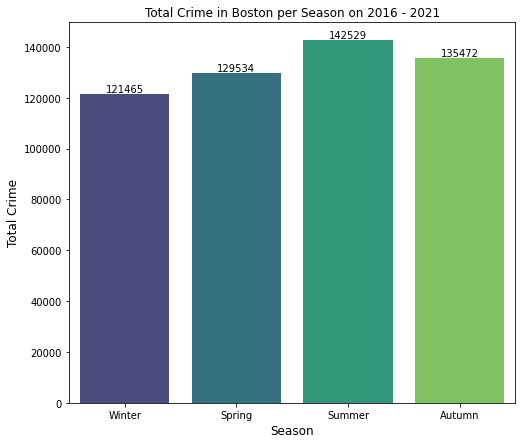

In [49]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'Season', data=df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston per Season on 2016 - 2021', size=12)
plt.xlabel('Season', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insights:

1. Now we can see more clearly that crime in Boston is rising and peaked until summer and start to goes down on Autumn to Winter. And then it will start to rise again during spring until Summer.

2. June-November is the range of months that crimes most likely to occur in Boston.

Question 3:

At what time does the crime in Boston oftenly occurred?

In [50]:
pd.crosstab(index=df['HOUR'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
HOUR,
17,33844
16,33133
18,32604
12,31432
19,28693
14,28613
0,28559
13,28166
15,27715


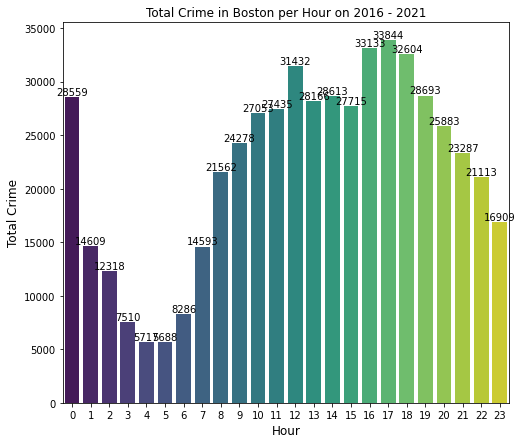

In [51]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'HOUR', data=df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston per Hour on 2016 - 2021', size=12)
plt.xlabel('Hour', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insight:

From the analysis, it can be seen that most of the crimes occurred after 7 am until 11 pm and spiked suddenly on hour 0 (12 a.m).

Question 4:

On what day that crimes in Boston oftenly occurred?

In [52]:
pd.crosstab(index=df['DAY_OF_WEEK'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
DAY_OF_WEEK,
Friday,80678
Wednesday,77451
Thursday,77002
Tuesday,76226
Monday,75942
Saturday,74515
Sunday,67186


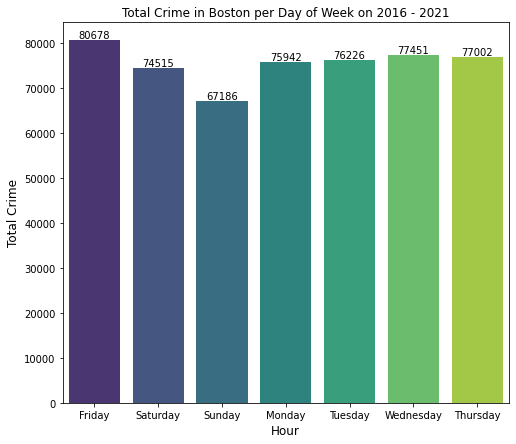

In [53]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'DAY_OF_WEEK', data=df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston per Day of Week on 2016 - 2021', size=12)
plt.xlabel('Hour', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insights:

From the analysis it can be seen that the crimes are almost equally distributed throughout Monday-Saturday, and Sunday being the lowest day of crimes occurred, and Friday being the day for the most occurred crime.

Also, we can see that crime numbers is down on the weekend (Saturday and Sunday)

Let's analyze it further with seperating the hour between workhour and weekend.

We will create an additional column that determines whether the crimes occurred on workhour and weekdays.

Question 5:

Does crime oftenly occurred on weekdays or more oftenly on weekend?

In [54]:
def workhour (hour):
    if hour >= 9 and hour <= 17:
       return "Yes"
    else:
       return "No"

## The traditional American business hours are 9:00 a.m. to 5:00 p.m.,
## Monday to Friday, representing a workweek of five eight-hour days comprising 40 hours in total. (Wikipedia)

In [55]:
df['Workhour'] = df.loc[:, 'HOUR'].apply(workhour)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season,Workhour
0,I162020140,3115,INVESTIGATE PERSON,South End,619,0,2016-01-01,2016,1,Friday,0,Part Three,WESTLAND AVE,42.343765,-71.088669,"(42.34376458, -71.08866865)",Winter,No
1,I172006977,1109,FRAUD - WIRE,Dorchester,451,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.294814,-71.072009,"(42.29481426, -71.07200871)",Winter,No
2,I182008540,1201,EMBEZZLEMENT,Downtown,122,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.350005,-71.063591,"(42.35000492, -71.06359053)",Winter,No
3,I162000796,3831,M/V - LEAVING SCENE - PROPERTY DAMAGE,Dorchester,435,0,2016-01-01,2016,1,Friday,0,Part Three,WASHINGTON ST,42.285811,-71.071155,"(42.28581121, -71.07115483)",Winter,No
4,I192014489,1107,FRAUD - LARCENY BY SCHEME,Dorchester,352,0,2016-01-01,2016,1,Friday,0,Part Two,DITSON ST,42.301085,-71.063908,"(42.30108481, -71.06390782)",Winter,No


In [56]:
def weekend (day):
    if (day == 'Saturday' or day == 'Sunday'):
       return "Yes"
    else:
       return "No"

In [57]:
df['Weekend'] = df.loc[:, 'DAY_OF_WEEK'].apply(weekend)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season,Workhour,Weekend
0,I162020140,3115,INVESTIGATE PERSON,South End,619,0,2016-01-01,2016,1,Friday,0,Part Three,WESTLAND AVE,42.343765,-71.088669,"(42.34376458, -71.08866865)",Winter,No,No
1,I172006977,1109,FRAUD - WIRE,Dorchester,451,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.294814,-71.072009,"(42.29481426, -71.07200871)",Winter,No,No
2,I182008540,1201,EMBEZZLEMENT,Downtown,122,0,2016-01-01,2016,1,Friday,0,Part Two,WASHINGTON ST,42.350005,-71.063591,"(42.35000492, -71.06359053)",Winter,No,No
3,I162000796,3831,M/V - LEAVING SCENE - PROPERTY DAMAGE,Dorchester,435,0,2016-01-01,2016,1,Friday,0,Part Three,WASHINGTON ST,42.285811,-71.071155,"(42.28581121, -71.07115483)",Winter,No,No
4,I192014489,1107,FRAUD - LARCENY BY SCHEME,Dorchester,352,0,2016-01-01,2016,1,Friday,0,Part Two,DITSON ST,42.301085,-71.063908,"(42.30108481, -71.06390782)",Winter,No,No


In [58]:
pd.crosstab(index=[df['Workhour'], df['Weekend']], columns='Total Crime')

col_0             Total Crime
Workhour Weekend             
No       No            189067
         Yes            78264
Yes      No            198232
         Yes            63437

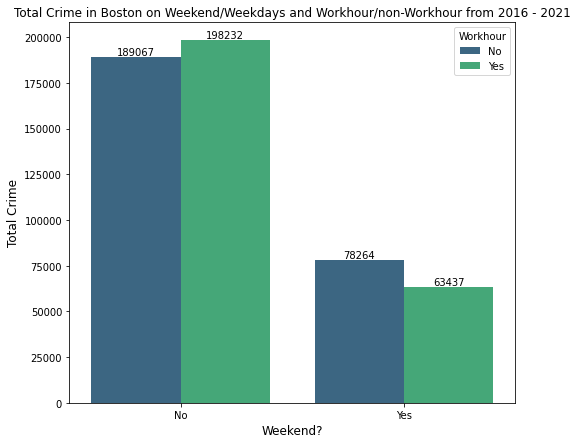

In [59]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'Weekend', data=df, hue='Workhour', palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plot.bar_label(plot.containers[1], label_type='edge')
plt.title('Total Crime in Boston on Weekend/Weekdays and Workhour/non-Workhour from 2016 - 2021', size=12)
plt.xlabel('Weekend?', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Inisght:

From crosstable and data visualization, we can gain 2 insights from it:

1. In line with the analysis before, we can see that there is a significant differences between number of crimes that occured on weekend and weekdays.
2. Crimes on weekdays usually occurs on workhour, while crime on weekend usually occurs on non-workhour.

Question 6:

What is most oftenly occurred crime's offences in Boston on 2016-2021? 

In [60]:
## Create new dataframe for crime offence

crimeoffencedf = pd.crosstab(index=df['OFFENSE_CODE_GROUP'], columns='Total Crime').reset_index()

In [61]:
fig = plx.treemap(crimeoffencedf, path=['OFFENSE_CODE_GROUP'],values='Total Crime', width=800, height=800,
title = 'Offences of Crime in Boston on 2016-2021', color_discrete_sequence = plx.colors.sequential.Viridis)
fig.data[0].textinfo = 'label+text+value'
fig.show()

Insights:

From the Tree Map, we can see all of the crimes that occured and their frequency of occurance. Also, we can notice that that 'Investigate Person' is the most oftenly occurred crime's offences in Boston on 2016 - 2021

To gain more information, let's further analyze the top 10 offence's of the analysis.

Question 7:

What is the top 10 most oftenly occured crime's offences on Boston? 

In [62]:
### Create new dataframe for top 10 crime's offence

top10offense = crimeoffencedf.sort_values('Total Crime', ascending=False).head(10).reset_index()
top10offense

col_0,index,OFFENSE_CODE_GROUP,Total Crime
0,105,INVESTIGATE PERSON,35596
1,131,M/V - LEAVING SCENE - PROPERTY DAMAGE,32201
2,212,SICK/INJURED/MEDICAL - PERSON,28931
3,228,VANDALISM,24015
4,106,INVESTIGATE PROPERTY,21510
5,220,TOWED MOTOR VEHICLE,19801
6,230,VERBAL DISPUTE,19702
7,10,ASSAULT & BATTERY,17847
8,186,PROPERTY - LOST,15336
9,118,LARCENY NON-ACCESSORY FROM VEH. $200 & OVER,15039


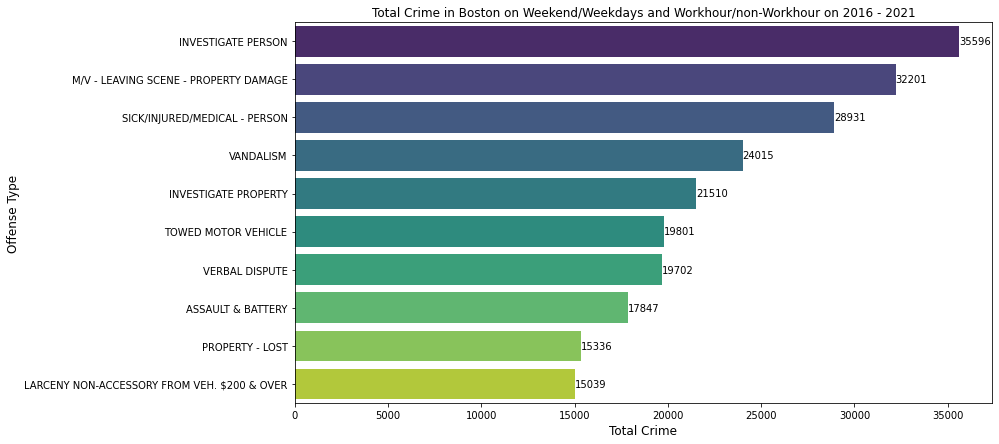

In [63]:
plt.figure(figsize=(12.5, 7))
plot = sns.barplot(data=top10offense, y = 'OFFENSE_CODE_GROUP', x ='Total Crime', ci=None, palette='viridis', orient='h')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Crime in Boston on Weekend/Weekdays and Workhour/non-Workhour on 2016 - 2021', size=12)
plt.xlabel('Total Crime', size=12)
plt.ylabel('Offense Type', size=12)
plt.show()

Insights:

The crime's offense type that occurred the most on Boston is Investigate Person, followed by Motor Vehicle - Leaving Scene - Property Damage, and Sick/Injured/Medical - Person.

Question 8:

Does crimes in Boston mostly involved shootings?

In [64]:
## Create new dataframe for creating pie chart on shooting crime.

shooting_pie = pd.crosstab(index=df['SHOOTING'], columns='Total Crimes').reset_index()
shooting_pie

col_0,SHOOTING,Total Crimes
0,0,525191
1,1,3809


In [65]:
## Changes '0' and '1' to be more informative

shootingdict = {
    0 : 'No Shooting Involved', 
    1 : 'Shooting Involved'
}

shooting_pie['SHOOTING'] = shooting_pie['SHOOTING'].replace(shootingdict)

In [66]:
fig = plx.pie(shooting_pie, values=shooting_pie['Total Crimes'], names=shooting_pie.SHOOTING.unique(),title='Shooting Crime Proportion in Boston on 2016-2021',
labels={'OFFENSE_CODE_GROUP':'Crime Type'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Insight:

On the total crimes that occured on Boston, there is actually a really small portion of crimes that involved shootings.

Let's further analyze the crime where shooting is involved.

Question 9:

What is the crime's offences that shooting oftenly occurred?

In [67]:
## Create new dataframe where shooting occurred

shooting1df = df[df.SHOOTING == 1]
shooting1ct = pd.crosstab(index=shooting1df['OFFENSE_CODE_GROUP'], columns='Total Crime').reset_index()
shooting1ct.tail()

col_0,OFFENSE_CODE_GROUP,Total Crime
69,VERBAL DISPUTE,1
70,VIOLATION - HAWKER AND PEDDLER,1
71,WARRANT ARREST,84
72,WEAPON - FIREARM - OTHER VIOLATION,23
73,WEAPON - OTHER - OTHER VIOLATION,4


In [68]:
fig = plx.treemap(shooting1ct, path=['OFFENSE_CODE_GROUP'],values='Total Crime', width=800, height=800,
title = 'Offences of Crime with Shooting in Boston on 2016-2021', color_discrete_sequence = plx.colors.sequential.Viridis)
fig.data[0].textinfo = 'label+text+value'
fig.show()

In [69]:
shootingbar = shooting1ct.sort_values('Total Crime', ascending=False).head(10)
shootingbar

col_0,OFFENSE_CODE_GROUP,Total Crime
29,INVESTIGATE PROPERTY,1199
4,ASSAULT D/W - OTHER,537
3,ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER,517
7,BALLISTICS EVIDENCE/FOUND,477
68,VANDALISM,270
40,MURDER NON-NEGLIGIENT MANSLAUGHTER,199
28,INVESTIGATE PERSON,107
23,FIREARM/WEAPON - CARRY - SELL - RENT,97
71,WARRANT ARREST,84
50,ROBBERY - FIREARM - BANK,32


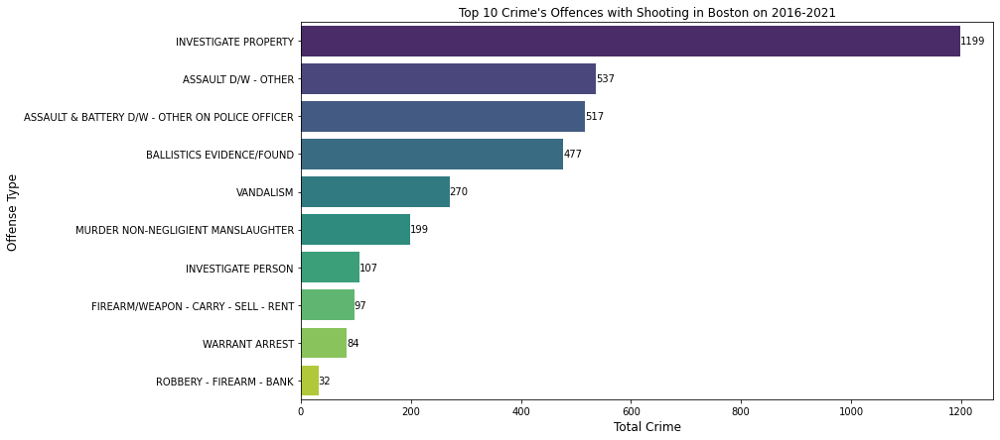

In [70]:
plt.figure(figsize=(12.5, 7))
plot = sns.barplot(data=shootingbar, y = 'OFFENSE_CODE_GROUP', x ='Total Crime', ci=None, palette='viridis', orient='h')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('''Top 10 Crime's Offences with Shooting in Boston on 2016-2021''', size=12)
plt.xlabel('Total Crime', size=12)
plt.ylabel('Offense Type', size=12)
plt.show()

Insights:

1. On the tree map, we can see all of the crime's offences where shooting is occurred and we can notice that there are no significant number of frequency except for 'Investigate Property' offences. This offence involved burglary, larceny-theft, motor vehicle theft, and arson ```Source: https://ucr.fbi.gov/crime-in-the-u.s/2010/crime-in-the-u.s.-2010/property-crime```

2. The other noticable offences is assault D/W (deadly weapon) on Other and Police Officer, and Ballistic Evidence/Found. All of this offences is expected to have high number because it is directly involve with gun.

3. Even though that 'Investigate Person' is the type of offences that is mostly occurred in Boston on 2016 - 2021, the offences is rarely involving a shooting, with only 107 shooting in the period of 2016-2021.

Question 10:

How is the Shooting crime trend number year by year in Boston on 2016 to 2021?

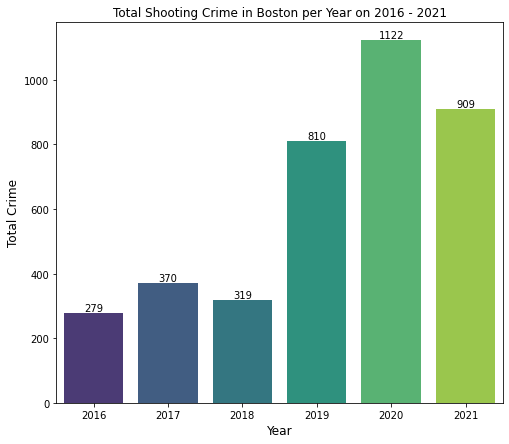

In [71]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'YEAR', data=shooting1df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Shooting Crime in Boston per Year on 2016 - 2021', size=12)
plt.xlabel('Year', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insight:

The trend on shooting crime is different compared to trend on crime in general from 2016 to 2021. It can be seen that from 2016-2018, the changes never past 100 count, and then from 2018-2019, the number of shooting almost tripled from 319 to 810, and hit its peak on 2020 with 1.122 shooting crime.

While 2020 to 2021 the shooting number was reduced to 909, the number is still a lot higher than 2016-2018 numbers.

Question 11:

In which season does the shooting mostly occurred?

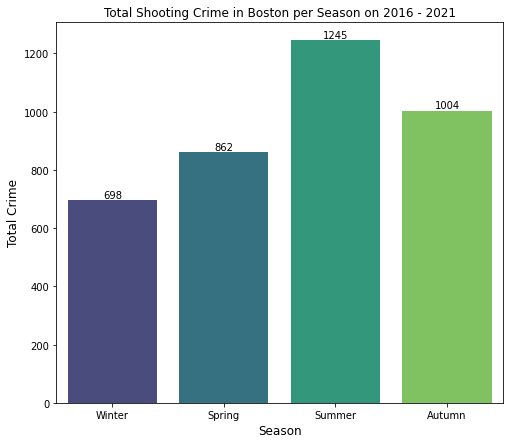

In [72]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'Season', data=shooting1df, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Shooting Crime in Boston per Season on 2016 - 2021', size=12)
plt.xlabel('Season', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insight:

We can see that the trend for shooting crime is similar with crime in general. The numbers peaked on Summer and went down on Autumn and Winter,and will rise again in Spring.

Now let's analyze the crime using UCR Part column.

The Uniform Crime Reporting (UCR) Program is a crime classification released by the FBI. It is mostly divided into two parts, Part one and Part two. However in this database there are three Parts. Part One, Part Two, and Part Three. At this moment, the writer can't found any reference mentioning the Part Three of UCR. But based on the description on FBI website, we can assume that Part Three is the less severe crime and Part One is the most severe crime.


*Source: https://ucr.fbi.gov/crime-in-the-u.s/2011/crime-in-the-u.s.-2011/offense-definitions

Limitation:

The Dataset that contains UCR Part is only for the year of 2016, 2017, and 2018. 

Question 12:

Which UCR classification that mostly occurred in Boston crime on 2016-2018?

In [73]:
## We will analyze the UCR Part using the .crosstab function, and by doing crosstab, we will ignore the missing value from UCR Part Columns

pd.crosstab(index=df['UCR_PART'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
UCR_PART,
Part Three,152627
Part Two,89745
Part One,55517
Other,1222


In [74]:
ucrpie = pd.crosstab(index=df['UCR_PART'], columns='Total Crime').sort_values('Total Crime', ascending=False).reset_index()

fig = plx.pie(ucrpie, values=ucrpie['Total Crime'], names=ucrpie.UCR_PART.unique(),title='UCR Proportion in Boston on 2016-2018',
labels={'UCR_PART':'Part'}, color_discrete_sequence = plx.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Insights:

Most of the crimes in Boston classified as UCR Part Three with the proportion of (51%) and 'Others' being the least classification with the proportion of just 0.4%.

Let's dig deeper into the Part One classification and see whats crime's classification that mostly occurred. 

In [75]:
partonedf = df[df['UCR_PART'] == 'Part One']

In [76]:
partonepie = pd.crosstab(index=partonedf['OFFENSE_CODE_GROUP'], columns='Total Crime').reset_index()

fig = plx.treemap(partonepie, path=['OFFENSE_CODE_GROUP'],values='Total Crime', width=800, height=800,
title = '''Crime's Offences on UCR Level One Proportion in Boston on 2016-2021''', color_discrete_sequence = plx.colors.sequential.Viridis)
fig.data[0].textinfo = 'label+text+value'
fig.show()

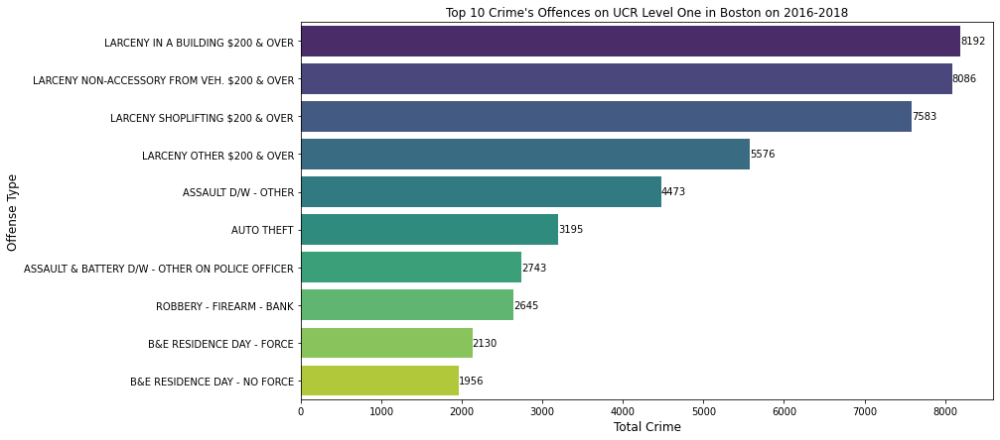

In [77]:
partonebar = pd.crosstab(index=partonedf['OFFENSE_CODE_GROUP'], columns='Total Crime').sort_values('Total Crime', ascending=False).reset_index().head(10)

plt.figure(figsize=(12.5, 7))
plot = sns.barplot(data=partonebar, y = 'OFFENSE_CODE_GROUP', x ='Total Crime', ci=None, palette='viridis', orient='h')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('''Top 10 Crime's Offences on UCR Level One in Boston on 2016-2018''', size=12)
plt.xlabel('Total Crime', size=12)
plt.ylabel('Offense Type', size=12)
plt.show()

Insight:

Crime offence's that usually most severe (Part One) is involving Larceny/Robbery, Assault, and Breaking & Entering.

Question 13:

When does the Part One crime classification mostly occurred?

In [78]:
df[df['UCR_PART'] == 'Part Three'].tail()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season,Workhour,Weekend
299194,I182105273,3410,TOWED MOTOR VEHICLE,Mattapan,441,0,2018-12-31 23:16:00,2018,12,Monday,23,Part Three,HARVARD ST,42.296346,-71.081817,"(42.29634574, -71.08181681)",Winter,No,No
299195,I192000001,3115,INVESTIGATE PERSON,South Boston,206,0,2018-12-31 23:20:00,2018,12,Monday,23,Part Three,NORTHERN AVE,42.353636,-71.047396,"(42.35363555, -71.04739570)",Winter,No,No
299196,I182105272,3006,SICK/INJURED/MEDICAL - PERSON,Hyde Park,555,0,2018-12-31 23:26:00,2018,12,Monday,23,Part Three,POPLAR ST,42.277147,-71.125124,"(42.27714676, -71.12512415)",Winter,No,No
299198,I192000003,3006,SICK/INJURED/MEDICAL - PERSON,Brighton,773,0,2018-12-31 23:38:00,2018,12,Monday,23,Part Three,KIRKWOOD RD,42.341269,-71.157506,"(42.34126852, -71.15750565)",Winter,No,No
299199,I192000002,3114,INVESTIGATE PROPERTY,South End,620,0,2018-12-31 23:41:00,2018,12,Monday,23,Part Three,BOYLSTON ST,42.347102,-71.088417,"(42.34710196, -71.08841746)",Winter,No,No


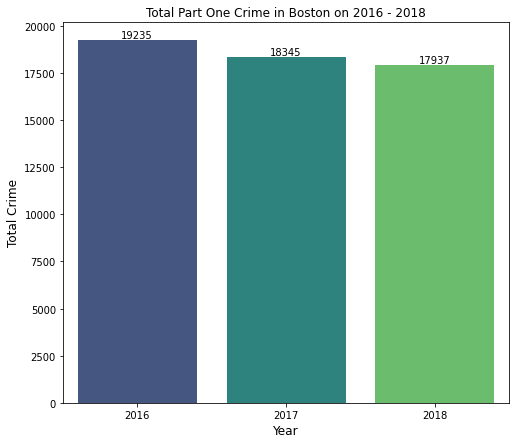

In [79]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'YEAR', data=partonedf, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Part One Crime in Boston on 2016 - 2018', size=12)
plt.xlabel('Year', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

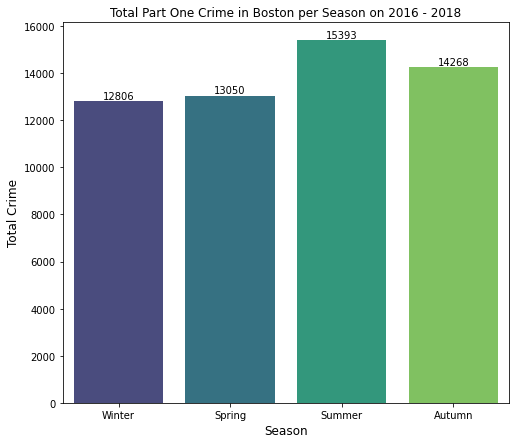

In [80]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'Season', data=partonedf, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Part One Crime in Boston per Season on 2016 - 2018', size=12)
plt.xlabel('Season', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

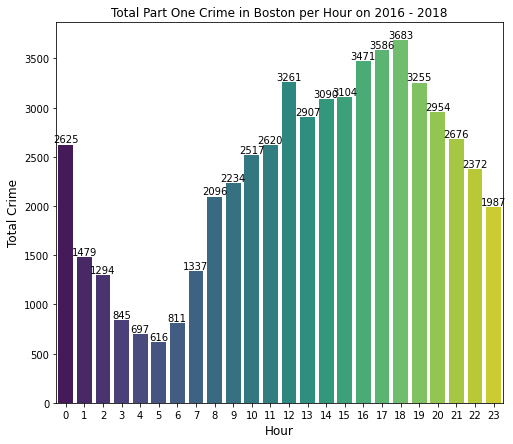

In [81]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'HOUR', data=partonedf, palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plt.title('Total Part One Crime in Boston per Hour on 2016 - 2018', size=12)
plt.xlabel('Hour', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

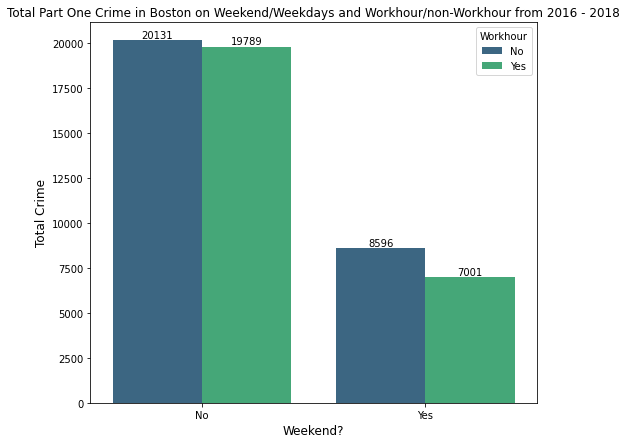

In [82]:
plt.figure(figsize=(8, 7))
plot = sns.countplot(x= 'Weekend', data=partonedf, hue='Workhour', palette='viridis')
plot.bar_label(plot.containers[0], label_type='edge')
plot.bar_label(plot.containers[1], label_type='edge')
plt.title('Total Part One Crime in Boston on Weekend/Weekdays and Workhour/non-Workhour from 2016 - 2018', size=12)
plt.xlabel('Weekend?', size=12)
plt.ylabel('Total Crime', size=12)
plt.show()

Insight:

1. The trends for crime that is classified as Part One on UCR, is almost the same crime in general. The only diffenrence is that the Part One crime is almost equally distributed in each season.
2. Highly severe crime mostly occurs on weekdays and outside of workhour (both on weekend and weekday)

Question 14:

Where is the location and district where the crime in Boston most oftenly occurred?

In [83]:
pd.crosstab(index=df['Location'], columns='Total Crime').sort_values('Total Crime', ascending=False).head(10)

col_0,Total Crime
Location,
"(42.29755532959655, -71.05970910242573)",3196
"(42.2975553295965, -71.0597091024257)",2557
"(42.32866283555608, -71.08563401183545)",2364
"(42.3395419898301, -71.0694087696754)",2274
"(42.33954198983014, -71.06940876967543)",2121
"(42.28482576580488, -71.09137368938802)",2010
"(42.3286628355561, -71.0856340118355)",1825
"(42.3618385665647, -71.0597648909416)",1671
"(42.34905600030506, -71.15049849975023)",1545


In [84]:
pd.crosstab(index=df['DISTRICT'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
DISTRICT,
Roxbury,80729
Dorchester,69558
South End,67980
Mattapan,59125
Downtown,58184
South Boston,39472
Brighton,34401
Hyde Park,29679
Jamaica Plain,29376


In [85]:
foliumheat = folium.Map(location=[42.361145,-71.057083], ## Boston coordinate, source: Google
                    zoom_start = 12, min_zoom=12)     

foliumdf = df[['Lat', 'Long']]
foliumdf = foliumdf.dropna(subset=['Lat', 'Long'])    
heat_data = [[row['Lat'],row['Long']] for index, row in foliumdf.iterrows()]

HeatMap(heat_data, radius=10).add_to(foliumheat)
foliumheat

Insight:

From the heatmap we can see that there are a lot of heat on Roxbury, Dorchester, and South End districts.

Question 15:

Where is the location and district where the Part One crime classification in Boston most oftenly occurred?

In [86]:
pd.crosstab(index=partonedf['Location'], columns='Total Crime').sort_values('Total Crime', ascending=False).head(10)

col_0,Total Crime
Location,
"(42.34862382, -71.08277637)",809
"(42.34797240, -71.07849582)",309
"(42.35095909, -71.07412780)",308
"(42.35512339, -71.06087980)",276
"(42.34840576, -71.08688339)",274
"(42.32696647, -71.06198607)",259
"(42.35602373, -71.06177615)",199
"(42.35997967, -71.05474135)",198
"(42.34980175, -71.07840978)",183


In [87]:
pd.crosstab(index=partonedf['DISTRICT'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
DISTRICT,
South End,10865
Roxbury,7890
Downtown,7812
Dorchester,6253
Mattapan,4523
South Boston,4168
Brighton,3471
Jamaica Plain,3247
Hyde Park,2300


In [88]:
foliumheatpartone = folium.Map(location=[42.361145,-71.057083], ## Boston coordinate, source: Google
                    zoom_start = 12, min_zoom=12)     

foliumpartonedf = partonedf[['Lat', 'Long']]
foliumpartonedf = foliumpartonedf.dropna(subset=['Lat', 'Long'])    
heat_data = [[row['Lat'],row['Long']] for index, row in foliumpartonedf.iterrows()]

HeatMap(heat_data, radius=10).add_to(foliumheatpartone)
foliumheatpartone

Insight:

From the crosstab and heatmap, we can see that the highly severe crime oftenly occurs on Boston's South End district. While the other district does not have higher heat like South End district.

Question 16:

Where is the location and district where the crime that involves shooting in Boston most oftenly occurred?

In [89]:
pd.crosstab(index=shooting1df['Location'], columns='Total Crime').sort_values('Total Crime', ascending=False).head(10)

col_0,Total Crime
Location,
"(42.33506218, -71.09316781)",8
"(42.33367922, -71.09187755)",8
"(42.28482577, -71.09137369)",8
"(42.38229155, -71.04036424)",7
"(42.334288406594155, -71.07239517543796)",7
"(42.32058475, -71.04470305)",7
"(42.31814836, -71.06708346)",7
"(42.35198700, -71.16510001)",7
"(42.31803027, -71.07787472)",7


In [90]:
pd.crosstab(index=shooting1df['DISTRICT'], columns='Total Crime').sort_values('Total Crime', ascending=False)

col_0,Total Crime
DISTRICT,
Roxbury,1098
Mattapan,1001
Dorchester,723
Jamaica Plain,210
Hyde Park,188
South End,171
South Boston,126
East Boston,67
West Roxbury,60


In [91]:
foliumheatshooting = folium.Map(location=[42.361145,-71.057083], ## Boston coordinate, source: Google
                    zoom_start = 12, min_zoom=12)     

foliumpshootingdf = shooting1df[['Lat', 'Long']]
foliumpshootingdf = foliumpshootingdf.dropna(subset=['Lat', 'Long'])    
heat_data = [[row['Lat'],row['Long']] for index, row in foliumpshootingdf.iterrows()]

HeatMap(heat_data, radius=10).add_to(foliumheatshooting)
foliumheatshooting

Insight:

Shooting oftenly occurred around Roxbury, Mattapan, and Dorchester. On the other districts, the heat are not as high as those 3 districts.

## Insights Recap

To recap, this is the insights that we got from the EDA:

1. Crime in Boston hit its peak on 2017, and have been on the downtrend afterwards, and start rising again on 2021.
2. On Monthly analysis, Crimes in Boston from 2016 - 2021, peaked in the month of August.
3. On Season analysis, crime in Boston is rising and peaked until summer and start to goes down on Autumn to Winter. And then it will start to rise again during spring until Summer.
4. June-November is the range of months that crimes most likely to occur in Boston.
5. Most of the crimes in Boston on 2016-2021 occurred after 7 am until 11 pm and suddenly spiked on 12 a.m.
6. Crimes in Boston are almost equally distributed throughout Monday-Saturday, and Sunday being the lowest day of crimes occurred, and Friday being the day for the most occurred crime.
7. There is a significant differences between number of crimes that occurred on Weekend and Weekdays, and Weekdays being the higher number of crimes that occurred.
8. Crimes in weekdays usually occurs on workhour, while crime in weekend usually occurs on non-workhour. (Workhour is 9am - 5pm)
9. The crime's offense type that occurred the most on Boston in 2016 - 2021 is Investigate Person, followed by Motor Vehicle - Leaving Scene - Property Damage, and Sick/Injured/Medical - Person
10. On the total crimes that occured on Boston, there is actually a really small portion of crimes that involved shootings (0.07%)
11. There are no significant number of shooting crime frequency except for crime's offences of 'Investigate Property'. This offence involved burglary, larceny-theft, motor vehicle theft, and arson. *Source: https://ucr.fbi.gov/crime-in-the-u.s/2010/crime-in-the-u.s.-2010/property-crime
12. The other noticable offences that involved shooting is assault D/W (deadly weapon) on Other and Police Officer, and Ballistic Evidence/Found. All of this offences is expected to have high number because it is directly involve with gun.
13. Even though that 'Investigate Person' is the type of offences that is mostly occurred in Boston on 2016 - 2021, the offences is rarely involving a shooting, with only 107 shooting in the period of 2016-2021
14. The trend on shooting crime is different compared to trend on crime in general from 2016 to 2021. It can be seen that from 2016-2018, the changes never past 100 count, and then from 2018-2019, the number of shooting almost tripled from 319 to 810, and hit its peak on 2020 with 1.122 shooting crime.
While 2020 to 2021 the shooting number was reduced to 909, the number is still a lot higher than 2016-2018 numbers.
15. The trend for crime's offences that involves shooting is similar with crime in general. The numbers peaked on Summer and went down on Autumn and Winter,and will rise again in Spring.
16. Most of the crimes in Boston on 2016-2018 classified as UCR Part Three with the proportion of (51%) and 'Others' being the least classification with the proportion of just 0.4%.
17. Crime's offences that caused high severity (UCR Part One) is involving Larceny/Robbery, Assault, and Breaking & Entering.
18. The trends for crime that is classified as Part One on UCR, is almost the same crime in general. The only diffenrence is that the Part One crime is almost equally distributed in each season.
19. Highly severe crime mostly occurs on weekdays and outside of workhour (both on weekend and weekday)
20. There are a lot of heat (crimes occurred) on Roxbury, Dorchester, and South End districts.
21. The highly severe crime (UCR Part One) oftenly occurs on Boston's South End district. While the other district does not have higher heat like South End district.
22. Shooting oftenly occurred around Roxbury, Mattapan, and Dorchester. On the other districts, the heat are not as high as those 3 districts.


## Analysis and Recommendation:

**Inisghts Analysis**

1. Contrary to the research conducted by Pew Research, we have found that Crime in Boston actually rose from 2016-2017 and 2020-2021. However, it is true that crime number in USA generally went down year after year. This gaps between crime numbers in city and crime numbers nationally, is maybe the reason that lot of people believed that crime number is rising.

```(Source: https://www.disastercenter.com/crime/uscrime.html)```

2. We found that crime number on Summer is the highest compared to other season. This finding is in line with the research conducted by U.S. Department of Justice, Bureau of Justice Statistics, that people are more likely to be a victim of violent crime during the summer season. And based on our findings, the UCR Part One is also having the highest occurrence on summer. 

```(Source: https://bjs.ojp.gov/content/pub/pdf/ics.pdf and https://www.thv11.com/article/news/crime/crime-increase-in-the-summer-time-yes/91-00e333f3-0cd3-4e54-8a51-5f98622f6692)```

3. Based on our findings, we have found that crimes in general, mostly occurs on Weekdays on work-hour, While highly offensive crime (UCR Part One) oftenly occurs outside workhour. This finding is in line with the research that was published by The Sleep Judge entitled "The Crimes at Night: Analyzing Police Incident Reports in Major Cities" where they found that violent crimes occur most often at night and police incidents tend to happen between Monday and Friday. 

```(Source: https://www.thesleepjudge.com/crimes-that-happen-while-you-sleep)```

4. Most crime's offences in Boston are classified as medium-low severe, with most crime's offences that occured are Investigate Person, Motor Vehicle incidents, and response to sick/medical/injured person. This finding's is also in line with shooting crime proportion in Boston which is very low (0.07%). However, we should notice that there are a significant uptrend of number of shooting crime in Boston. from 2018-2019, the number of shooting almost tripled from 319 to 810, and hit its peak on 2020 with 1.122 shooting crime. While 2020 to 2021 the shooting number was reduced to 909, the number is still a lot higher than 2016-2018 numbers.

From the analysis we know that shooting crimes oftenly occured on burglary, larceny-theft, motor vehicle theft, and arson offence. The rising numbers of shooting on 2019 to 2020 is well may be caused by those crimes related to COVID-19 pandemic. Based on the research conducted by ```Matthew P. J. Ashby entitled "Initial evidence on the relationship between the coronavirus pandemic and crime in the United States"```, the research have found that public health crises affect crime rates. The chief of media relations for the Boston Police Department, Sgt. Detective John Boyle, has said that due to the widespread unemployment brought upon many people by the pandemic, Boston Police expected property crimes such as breaking-and-entering, theft, robbery. In which, those crimes are oftenly include shooting. 

```(Source: Ashby, Matthew PJ. "Initial evidence on the relationship between the coronavirus pandemic and crime in the United States." Crime Science 9.1 (2020): 1-16, and https://thesuffolkjournal.com/36697/news/the-covid-19-pandemic-and-its-effect-on-bostons-crime-rate/)```

5. From the data analysis, we can conclude that Roxbury, Dorchester, Mattapan, and South End is the districts where most crime occurred.

**Recommendation**

1. We can conclude that even though the crime rate is down nation-wide, but crime rate in Boston specifically is actually fluctuate over the year. To make the public feel safer, especially the locals/residents, one of the initiatives the government can take is NeighborhoodStat. NeighborhoodStat was envisioned by the New York City Mayor’s Office of Criminal Justice (MOCJ) as a strategy for bringing residents together with city leadership to jointly address persistent challenges within the city’s public housing developments. NeighborhoodStat empowers residents to set their own agenda for addressing the issues affecting the safety of their neighborhoods and puts in place a structure allowing them to partner with city leaders to bring their vision into reality.
New York’s approach has proved effective. When MAP was founded in 2014, the target communities accounted for nearly 20 percent of violent crime across the city’s 328 public housing developments. Since then, crime and violence have fallen significantly. Target communities have experienced an 11 percent reduction in violent crime and a 10 percent reduction in the major crime categories known as index crimes. And while crime rates have been trending downward across the city of New York, target developments have outpaced other New York City Housing Authority developments in crime reduction.

```(Source: https://www.americanprogress.org/article/neighborhoodstat-strengthening-public-safety-community-empowerment/)```

2. a. From a research entitled ```"Summer jobs reduce violence among disadvantaged youth." (Sara B. Heller, 2015)```, it is founded that Summer Jobs can lower the crime rate during summer, especially on teenager. The researcher have found 43% reduction in arrest for violent crimes among youths.

- Government: Based on that research, the government can give an extra incentive to the youth or family member that are willing to take the summer jobs program.

- Citizen/Residents: Citizen/Residents can encourage their relatives/family member to take the summer jobs program

```(Source: Heller, Sara B. "Summer jobs reduce violence among disadvantaged youth." Science 346.6214 (2014): 1219-1223.)```

2. b. Other initiatives that the government can take is the "Summer Crime Prevention Initiative" that is being run by DC Government since 2010. The initiative will focuses the Boston Police Department (BPD) to deploy all available resources and calls upon partner agencies and organizations to assist in a coordinated effort to eliminate violent crime in the disctrict that have high-density of crime.
```(Source: https://mpdc.dc.gov/page/summer-crime-prevention-initiative)```


3. Other than the NeighborhoodStat initiatives, the government (including the police) and the residents of Boston can take an initiatives such as reducing alcohol availability, improving street connectivity, and providing green housing environments that is proven can reduce violent crimes (UCR Part One). 

```(Source: Kondo, Michelle C., et al. "Neighborhood interventions to reduce violence." Annual review of public health 39.1 (2018): 253-271.)```

Also, the government and residents of Boston can make a regulation of curfew that is customized for each districts or neighborhood.

4. Based on the research conducted by ```Sanchez, Carol, et al. entitled "A systematic review of the causes and prevention strategies in reducing gun violence in the United States." on 2020```, the researchers have found that Gun violence is pervasive and multi-factorial. Interventions aimed at reducing gun violence should be targeted towards the most common risk factors cited in the literature such as access, violent behavioral tendencies due to past exposure or substance abuse, and mental illness including suicidal ideation.

Related to that findings, the action that can be taken by the governments are:

- Reduce easy access to dangerous weapons. e.g: Mandatory background check for people who want to buy a gun
- Support gun violence research. e.g: Ensure that the Centers for Disease Control and Prevention (CDC) and others have the resources to study this issue and provide science-based guidance. 
- Hold the gun industry accountable and ensure there is adequate oversight over the marketing and sales of guns and ammunition.

```(Source: https://www.preventioninstitute.org/focus-areas/preventing-violence-and-reducing-injury/preventing-violence-advocacy)```

Other policies that can be taken by the governments are limiting children's access to guns, restricting concealed-carry permits, and restricting "stand your ground" policies. Based on the research conducted by Michael Price on 2020, these 3 policies can reduce gun deaths by more than 10%.

```(Source: https://www.science.org/content/article/three-types-laws-could-reduce-gun-deaths-more-10)```

5. The government and the citizen of the hot-spot district can work together to implement an action that can help to reduce crime such as:
-  Improvements to the public realm—such as urban greening and tree canopy programs in urban neighborhoods. 

```(Source: Kondo MC, South  EC, Branas  CC, Richmond  TS, Wiebe  DJ.  The association between urban tree cover and gun assault: a case-control and case-crossover study.)```
- Increasing the number of spaces for informal contact between neighbors. 

```(Source: Sullivan, W. C., Kuo, F. E., & Depooter, S. F. (2004). The fruit of urban nature: Vital neighborhood spaces. Environment and behavior, 36(5), 678-700)```
- Create a Community-Based and Civic Organizations in leading anti-violence programs. 

```(Source: Sharkey, P. (2018). Uneasy peace: The great crime decline, the renewal of city life, and the next war on violence. WW Norton & Company.)```

#### [**Tableau Dashboard**](https://public.tableau.com/app/profile/delabrilliano.ismail/viz/CrimeinBostonDashboard/BostonCrimeDashboard?publish=yes)